# Social Interactions Project "NHL"

_By Eliane Albisser, Dominik Gabler, Michael Wechsler_

In [1]:
import os
os.getcwd()

'C:\\Users\\gable\\Projects\\Social Interactions\\GroupWork'

## Introduction

Hockey games depend from the interaction between teammates and among teams. 

Our project analyses the patterns for the game outcomes from the NHL. 

Consequently, examined this group work the specific dynamics of connections of the NHL team and the teammates based on social network analysis. 

### Facts about NHL

* professional ice hockey league in North America
* comprising 31 teams divided in the following two conferences:
  * Eastern Conference (16 teams)
  * Western Conference (15 teams)
* conferences are split into two divisions

### NHL Teams Mapping

TeamID | ShortName | LongName
--- | --- | ---
1 | AND | Anaheim Ducks
2 | ARI	| Arizona Coyotes
3 | BOS	| Boston Bruins
4 | BUF	| Buffalo Sabres
5 | CAL	| Calgary Flames
6 | CAR	| Carolina Hurricanes
7 | CBS	| Columbus Blue Jackets
8 | CHI	| Chigaco Blackhawks
9 | COL	| Colorado Avalanche
10 | DAL | Dallas Stars
11 | DET | Detroit Red Wings
12 | EDM | Edmonton Oilers
13 | FLO | Florida Panthers
14 | LAK | Los Angeles Kings
15 | MIN | Minnesota Wild
16 | MTL | Montreal Canadiens
17 | NAS | Nashville Predators
18 | NJD | New Jersey Devils
19 | NYI | New York Islanders
20 | NYR | New York Rangers
21 | OTT | Ottawa Senators
22 | PHI | Philadelphia Flyers
23 | PIT | Pittsburgh Penguins
24 | SJS | San Jose Sharks
25 | STL | St. Louis Blues
26 | TBL | Tampa Bay Lightning
27 | TOR | Toronto Maple Leafs
28 | VAN | Vancouver Canucks
29 | VEG | Vegas Golden Knights
30 | WAS | Washington Capitals
31 | WPG | Winnipeg Jets

## Questions to answer

- What are patterns of the network NHL behind a team becoming the champion?
- Which composition of the hockey players makes the hockey team better?

## Data and Networks

**Datasource**

* taken from Github
* originally maintained through the hockey-databank Yahoo group

**Dataset**

* includes 21 tables over the whole history of NHL
* no detailled match statistics, but aggregated information
* only data of season 2017/2018 is extracted for the project

**Relevant information**

* team vs team
* team name
* player name

## Entities in the network

__Actors (=Nodes)__

The project described here analysis the following connected actors:
- hockey teams in the NHL
- hockey players of NHL teams

__Interaction (=Edges)__

To understand how the social system (e. g. NHL and hockey team) perform, we take into account how exactly the actors (e. g. hockey player and hockey teams) are connected:
- interactions between different teams in a hockey season (fight a duel)
- interactions/interplay between teammates in a hockey game

## Approach

<img src="Approach.png">

### mysql.connector

We were able to establish a connection to the mysql-db. Also we could create some statements and get some results directly from database. But the informations are in more different tables and it's not easy to directly create them in a nice format as a adjacency list or matrix. That's why we decided to not anymore follow this way and used statements directly in mysql to afterwards export the data and build adjacency lists in excel.

In [32]:
import mysql.connector
from mysql.connector import Error

try:
    connection = mysql.connector.connect(host='localhost',
                                         database='nhl_data',
                                         user='root',
                                         password='Domisck1993.')
    if connection.is_connected():
        db_Info = connection.get_server_info()
        print("Connected to MySQL Server version ", db_Info)
        cursor = connection.cursor()
        cursor.execute("select database();")
        record = cursor.fetchone()
        print("You're connected to database: ", record)

except Error as e:
    print("Error while connecting to MySQL", e)

finally:
    if (connection.is_connected()):
        cursor.close()
        connection.close()
        print("MySQL connection is closed")

Connected to MySQL Server version  8.0.15
You're connected to database:  ('nhl_data',)
MySQL connection is closed


In [33]:
# Open database connection
db = mysql.connector.connect(host='localhost',
                             database='nhl_data',
                             user='root',
                             password='Domisck1993.')

# prepare a cursor object using cursor() method
cursor = db.cursor()

# Create table as per requirement
sql = """SELECT t.tmID, t.confID
         FROM nhl_data.teams t
         WHERE year = 2017;)"""

cursor.execute(sql)
records = cursor.fetchall()
print(records)

# disconnect from server
db.close()

[('AND', 0), ('ARI', 0), ('BOS', 0), ('BUF', 0), ('CAL', 0), ('CAR', 0), ('CBS', 0), ('CHI', 0), ('COL', 0), ('DAL', 0), ('DET', 0), ('EDM', 0), ('FLO', 0), ('LAK', 0), ('MIN', 0), ('MTL', 0), ('NAS', 0), ('NJD', 0), ('NYI', 0), ('NYR', 0), ('OTT', 0), ('PHI', 0), ('PIT', 0), ('SJS', 0), ('STL', 0), ('TBL', 0), ('TOR', 0), ('VAN', 0), ('VEG', 0), ('WAS', 0), ('WPG', 0)]


### Library nhlscrapi

We also found the library nhlscrapi and tried to import some interestings stats directly from there. But unfortunately this way didn't really work, because of a bug in the library we weren't able to fix in a quick way.

Before you can use nhlscrapi you will need to use this command: *pip install nhlscrapi*

In [45]:
from nhlscrapi.games.game import Game, GameKey, GameType
from nhlscrapi.games.cumstats import Score, ShotCt, Corsi, Fenwick

season = 2014
game_num = 1226
game_type = GameType.Regular
game_key = GameKey(season, game_type, game_num)

# define stat types that will be counted as the plays are parsed
cum_stats = {
  'Score': Score(),
  'Shots': ShotCt(),
  'Corsi': Corsi(),
  'Fenwick': Fenwick()
}
game = Game(game_key, cum_stats=cum_stats)

# also http requests and processing are lazy
# accumulators require play by play info so they parse the RTSS PBP
#print('Final         : {}'.format(game.cum_stats['Score'].total))
#print('Shootout      : {}'.format(game.cum_stats['Score'].shootout.total))
#print('Shots         : {}'.format(game.cum_stats['Shots'].total))
#print('EV Shot Atts  : {}'.format(game.cum_stats['Corsi'].total))
#print('Corsi         : {}'.format(game.cum_stats['Corsi'].share()))
#print('FW Shot Atts  : {}'.format(game.cum_stats['Fenwick'].total))
#print('Fenwick       : {}'.format(game.cum_stats['Fenwick'].share()))

# scrape all remaining reports
# game.load_all()

### NHL API

Very late in the project we found the NHL API, which provides so much interesting information about each single game. Unfortunately we didn't have time to have a closer look on it. But we think it would offer great possibilities to create some new social interactions plots and of course analyses. 

In [ ]:
import numpy as np
import pandas as pd
import requests
import json
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder

for game_id in range(2017020001, 2017021271, 1):
    url = 'https://statsapi.web.nhl.com/api/v1/game/{}/feed/live'.format(game_id)
    r = requests.get(url)
    game_data = r.json()

event_dict = game_data.get('liveData').get('plays').get('allPlays')
event_dict2 = [ d['players'] for d in event_dict if 'players' in d]
event_dict3 = [ f[0] for f in event_dict2]
event_dict4 = [ g['player'] for g in event_dict3 if g['playerType'] == 'Scorer']
scorer = [ h['fullName'] for h in event_dict4]

In [314]:
scorer

['Nazem Kadri',
 'James van Riemsdyk',
 'William Nylander',
 'Patrick Marleau',
 'Patrick Marleau',
 'Mitchell Marner',
 'Mark Scheifele',
 'Auston Matthews',
 'Mathieu Perreault']

In [318]:
url = 'https://statsapi.web.nhl.com/api/v1/game/2017020001/feed/live'.format(game_id)
r = requests.get(url)
game_data_test = r.json()

In [319]:
game_data_test

{'copyright': 'NHL and the NHL Shield are registered trademarks of the National Hockey League. NHL and NHL team marks are the property of the NHL and its teams. © NHL 2019. All Rights Reserved.',
 'gamePk': 2017020001,
 'link': '/api/v1/game/2017020001/feed/live',
 'metaData': {'wait': 10, 'timeStamp': '20171006_173713'},
 'gameData': {'game': {'pk': 2017020001, 'season': '20172018', 'type': 'R'},
  'datetime': {'dateTime': '2017-10-04T23:00:00Z',
   'endDateTime': '2017-10-05T01:50:41Z'},
  'status': {'abstractGameState': 'Final',
   'codedGameState': '7',
   'detailedState': 'Final',
   'statusCode': '7',
   'startTimeTBD': False},
  'teams': {'away': {'id': 10,
    'name': 'Toronto Maple Leafs',
    'link': '/api/v1/teams/10',
    'venue': {'id': 5015,
     'name': 'Air Canada Centre',
     'link': '/api/v1/venues/5015',
     'city': 'Toronto',
     'timeZone': {'id': 'America/Toronto', 'offset': -4, 'tz': 'EDT'}},
    'abbreviation': 'TOR',
    'triCode': 'TOR',
    'teamName': 'Ma

## Results

In [48]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import networkx as nx
import community

### Team vs. Team total

For the first analysis we've created an adjacency list with three columns. In the third column is the number of wins from the first named team against second named team.

TeamID 1 | TeamID 2 | Number of wins
--- | --- | ---
1 | 2 | 3
1 | 3 | 3
... | ... | ...

These data has been read into nx.DiGraph "team1".

In [50]:
team1 = nx.read_edgelist('TeamvsTeam.txt',
                        delimiter = '\t', 
                        create_using = nx.DiGraph(), 
                        nodetype = int,
                        data = (('weight',int),))

In [51]:
print(nx.info(team1))

Name: 
Type: DiGraph
Number of nodes: 31
Number of edges: 761
Average in degree:  24.5484
Average out degree:  24.5484


In [52]:
team1.edges(data=True)

OutEdgeDataView([(1, 2, {'weight': 3}), (1, 3, {'weight': 2}), (1, 4, {'weight': 1}), (1, 5, {'weight': 2}), (1, 6, {'weight': 2}), (1, 7, {'weight': 1}), (1, 8, {'weight': 2}), (1, 9, {'weight': 1}), (1, 10, {'weight': 2}), (1, 11, {'weight': 1}), (1, 12, {'weight': 2}), (1, 13, {'weight': 1}), (1, 14, {'weight': 3}), (1, 15, {'weight': 2}), (1, 16, {'weight': 1}), (1, 18, {'weight': 1}), (1, 19, {'weight': 2}), (1, 20, {'weight': 1}), (1, 21, {'weight': 1}), (1, 22, {'weight': 1}), (1, 23, {'weight': 2}), (1, 24, {'weight': 1}), (1, 25, {'weight': 2}), (1, 26, {'weight': 1}), (1, 28, {'weight': 3}), (1, 29, {'weight': 1}), (1, 30, {'weight': 1}), (1, 31, {'weight': 1}), (2, 1, {'weight': 1}), (2, 4, {'weight': 1}), (2, 5, {'weight': 2}), (2, 6, {'weight': 1}), (2, 8, {'weight': 1}), (2, 9, {'weight': 1}), (2, 12, {'weight': 1}), (2, 14, {'weight': 2}), (2, 15, {'weight': 2}), (2, 16, {'weight': 2}), (2, 17, {'weight': 1}), (2, 18, {'weight': 1}), (2, 19, {'weight': 1}), (2, 21, {'wei

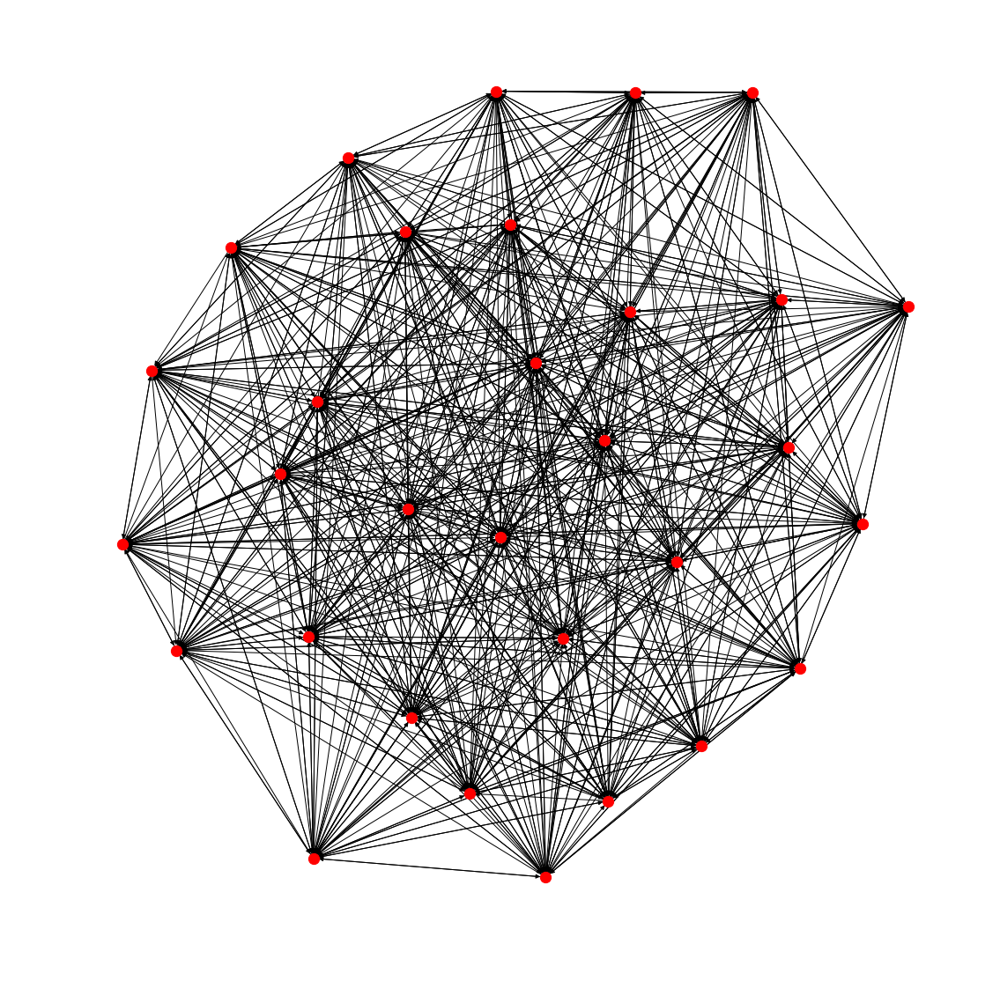

In [53]:
plt.figure(figsize=(15,15))

coords = nx.kamada_kawai_layout(team1)

nx.draw(team1, 
        pos = coords,
        node_size = 150,
        data = True)

For better comprehensability we added also a list with the short team names, so we can use them as labels.

In [55]:
with open('Teams.txt') as file:
    teams = list(map(lambda s: s.strip(), list(file)))

In [56]:
n_nodes_teams = len(teams)

In [57]:
dict_teams = {i+1: teams[i] for i in range(0, n_nodes_teams)}
dict_teams

{1: 'AND',
 2: 'ARI',
 3: 'BOS',
 4: 'BUF',
 5: 'CAL',
 6: 'CAR',
 7: 'CBS',
 8: 'CHI',
 9: 'COL',
 10: 'DAL',
 11: 'DET',
 12: 'EDM',
 13: 'FLO',
 14: 'LAK',
 15: 'MIN',
 16: 'MTL',
 17: 'NAS',
 18: 'NJD',
 19: 'NYI',
 20: 'NYR',
 21: 'OTT',
 22: 'PHI',
 23: 'PIT',
 24: 'SJS',
 25: 'STL',
 26: 'TBL',
 27: 'TOR',
 28: 'VAN',
 29: 'VEG',
 30: 'WAS',
 31: 'WPG'}

In [58]:
nx.set_node_attributes(team1, dict_teams, 'team_name')
team_name = nx.get_node_attributes(team1, 'team_name')

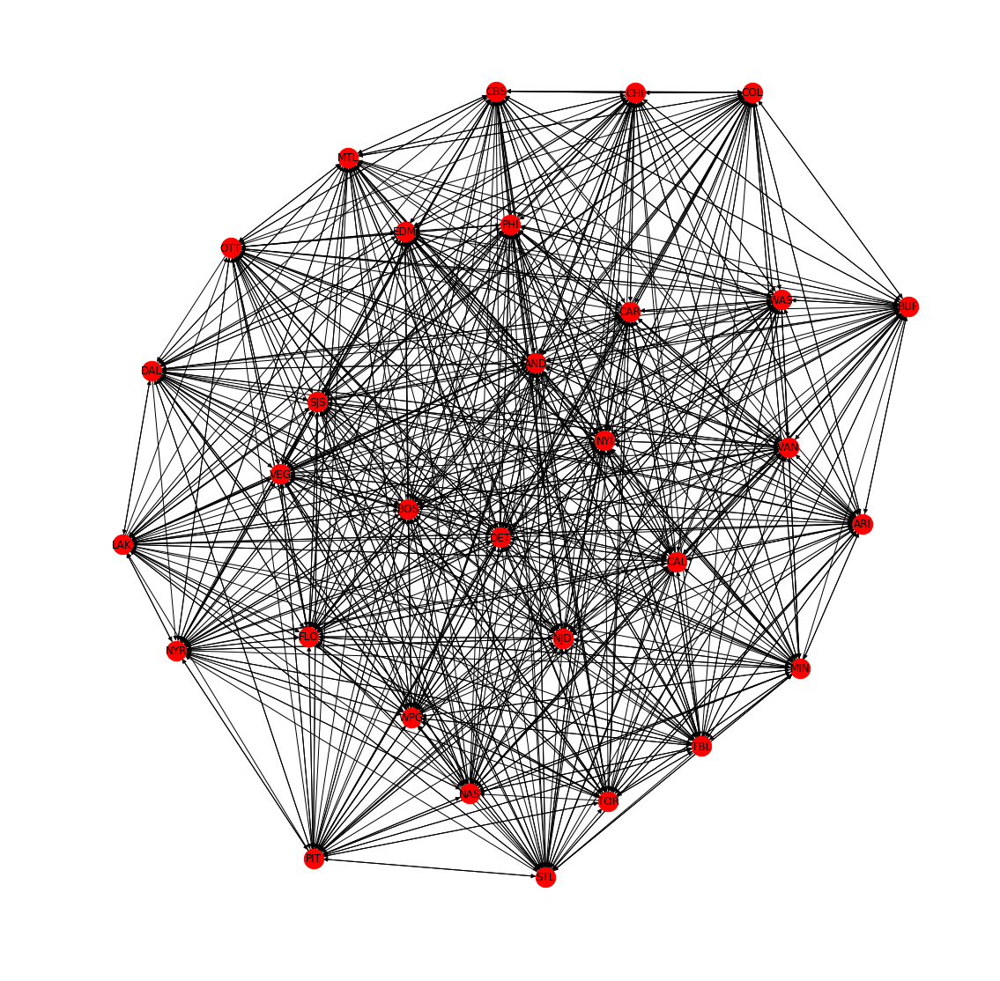

In [59]:
plt.figure(figsize=(15,15))

nx.draw(team1, 
        pos = coords,
        node_size = 500,
        data = True,
        labels = team_name)

And we added also the information about conference (eastern or western) to get a better overview about the different 31 teams.

In [60]:
with open('Conference.txt') as file:
    conference = list(map(int, list(file)))

In [61]:
dict_conf = {i+1: conference[i] for i in range(0, n_nodes_teams)}
dict_conf

{1: 0,
 2: 0,
 3: 1,
 4: 1,
 5: 0,
 6: 1,
 7: 1,
 8: 0,
 9: 0,
 10: 0,
 11: 1,
 12: 0,
 13: 1,
 14: 0,
 15: 0,
 16: 1,
 17: 0,
 18: 1,
 19: 1,
 20: 1,
 21: 1,
 22: 1,
 23: 1,
 24: 0,
 25: 0,
 26: 1,
 27: 1,
 28: 0,
 29: 0,
 30: 1,
 31: 0}

In [62]:
nx.set_node_attributes(team1, dict_conf, 'conference')
team_conference = nx.get_node_attributes(team1, 'conference')

In [64]:
colors_conference = []

for i in team1.nodes():
    if team1.nodes()[i]['conference'] == 1:
        colors_conference.append('red') # Eastern Conference
    elif team1.nodes()[i]['conference'] == 0:
        colors_conference.append('skyblue') # Western Conference

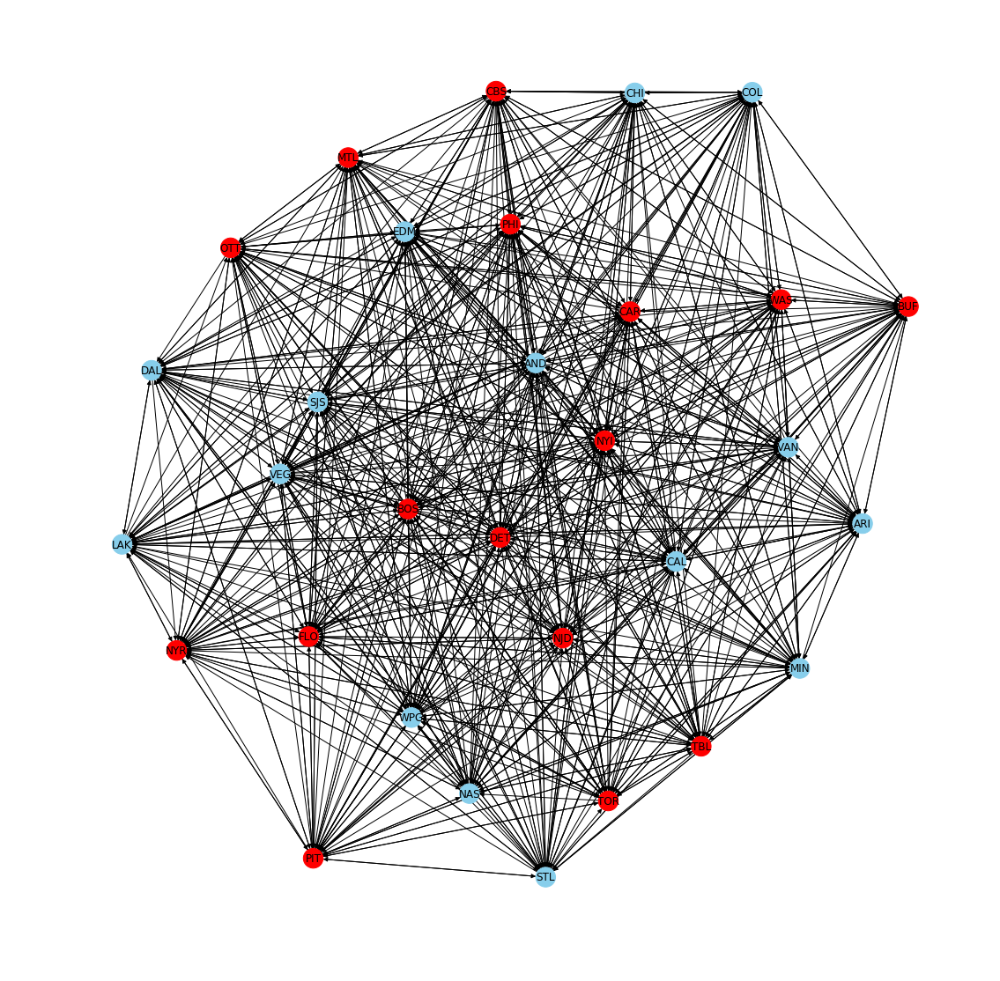

In [65]:
plt.figure(figsize=(15,15))

nx.draw(team1,
        pos = coords,
        node_size = 500,
        data = True,
        labels = team_name,
        node_color = colors_conference)

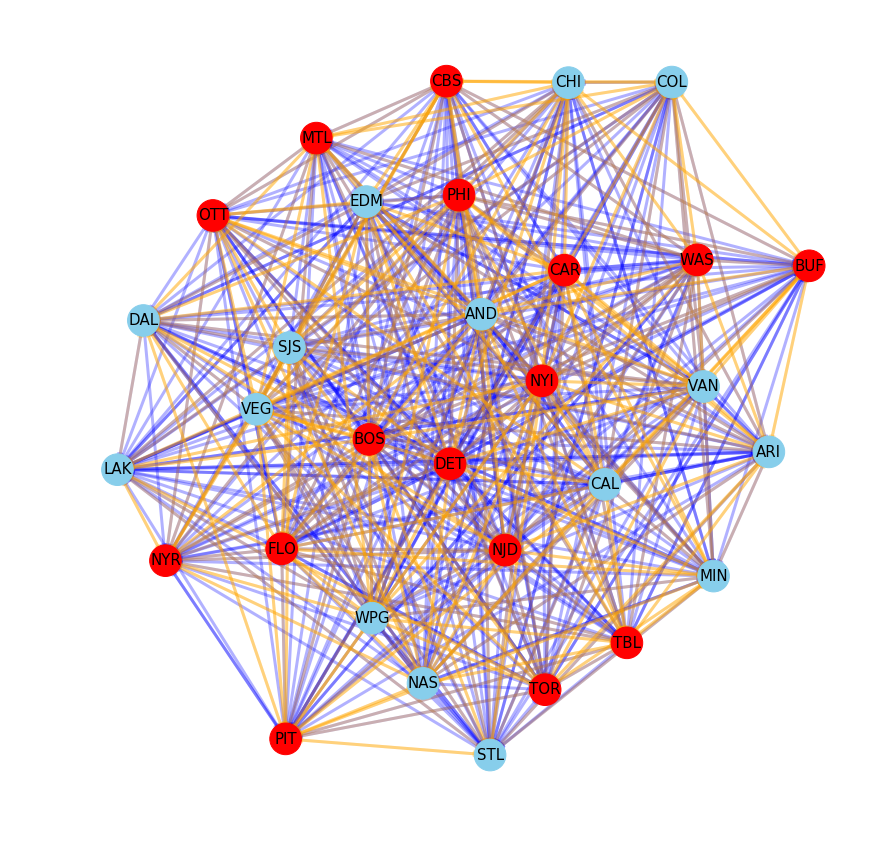

In [106]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(team1)

elarge = [(u, v) for (u, v, d) in team1.edges(data=True) if d["weight"] > 1]
esmall = [(u, v) for (u, v, d) in team1.edges(data=True) if d["weight"] <= 1]

# nodes
nx.draw_networkx_nodes(team1,
                       pos,
                       node_size=1000,
                       node_color = colors_conference)

# edges
nx.draw_networkx_edges(team1,
                       pos,
                       edgelist=elarge,
                       width=3,
                       alpha=0.3,
                       edge_color="blue",
                       style='dashed')
nx.draw_networkx_edges(team1,
                       pos,
                       edgelist=esmall,
                       width=3,
                       alpha=0.3,
                       edge_color="orange",
                       style="dotted")

# labels
nx.draw_networkx_labels(team1,
                        pos,
                        team_name,
                        font_size=15)

plt.axis("off")
plt.show()

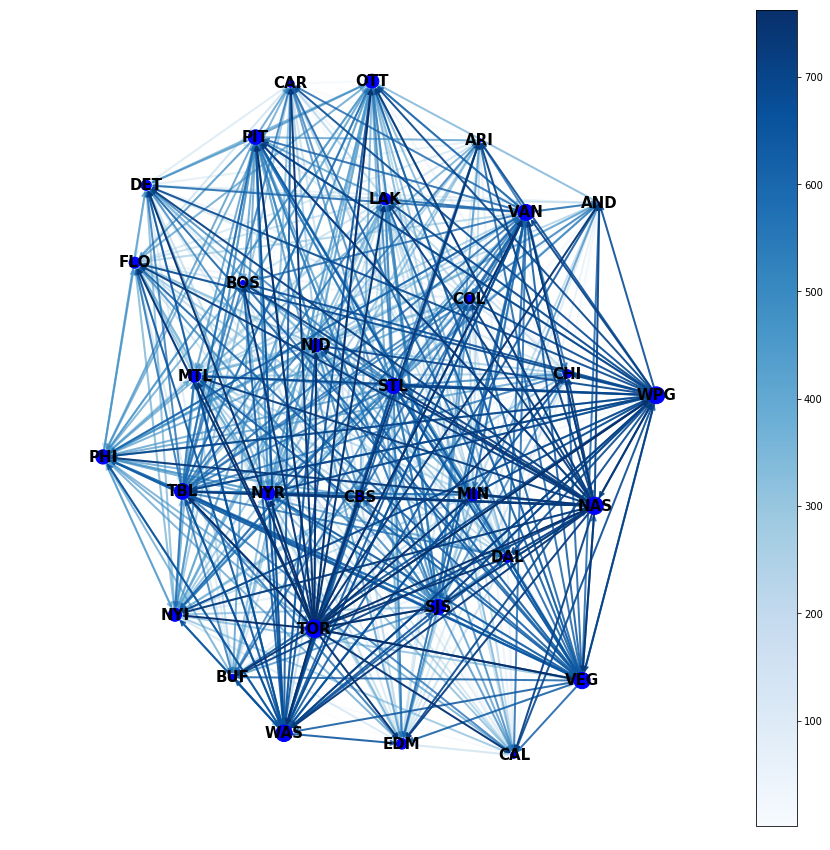

In [112]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(strongerteam)

node_sizes = [3 + 10 * i for i in range(len(team1))]
M = team1.number_of_edges()
edge_colors = range(2, M + 2)
edge_alphas = [(5 + i) / (M + 4) for i in range(M)]

#nodes
nodes = nx.draw_networkx_nodes(team1,
                               pos,
                               node_size=node_sizes,
                               node_color="blue")

#edges
edges = nx.draw_networkx_edges(team1,
                               pos,
                               node_size=node_sizes,
                               arrowstyle="->",
                               arrowsize=10,
                               edge_color=edge_colors,
                               edge_cmap=plt.cm.Blues,
                               width=2)

#labels
labels = nx.draw_networkx_labels(team1,
                                pos,
                                team_name,
                                font_color="black",
                                font_size=15,
                                font_weight = "bold")

# set alpha value for each edge
for i in range(M):
    edges[i].set_alpha(edge_alphas[i])

pc = mpl.collections.PatchCollection(edges, cmap=plt.cm.Blues)
pc.set_array(edge_colors)
plt.colorbar(pc)

ax = plt.gca()
ax.set_axis_off()
plt.show()

In [70]:
team1_outdegree = nx.out_degree_centrality(team1)
for i in team1_outdegree:
    team1_outdegree[i] = int(team1_outdegree[i] * (n_nodes_teams-1))
team1_outdegree

{1: 28,
 2: 22,
 3: 27,
 4: 18,
 5: 24,
 6: 24,
 7: 24,
 8: 23,
 9: 25,
 10: 24,
 11: 22,
 12: 22,
 13: 26,
 14: 26,
 15: 27,
 16: 18,
 18: 24,
 19: 24,
 20: 23,
 21: 20,
 22: 26,
 23: 26,
 24: 25,
 25: 25,
 26: 28,
 28: 22,
 29: 28,
 30: 26,
 31: 29,
 17: 28,
 27: 27}

In [71]:
nx.set_node_attributes(team1, team1_outdegree, 'outdegree')

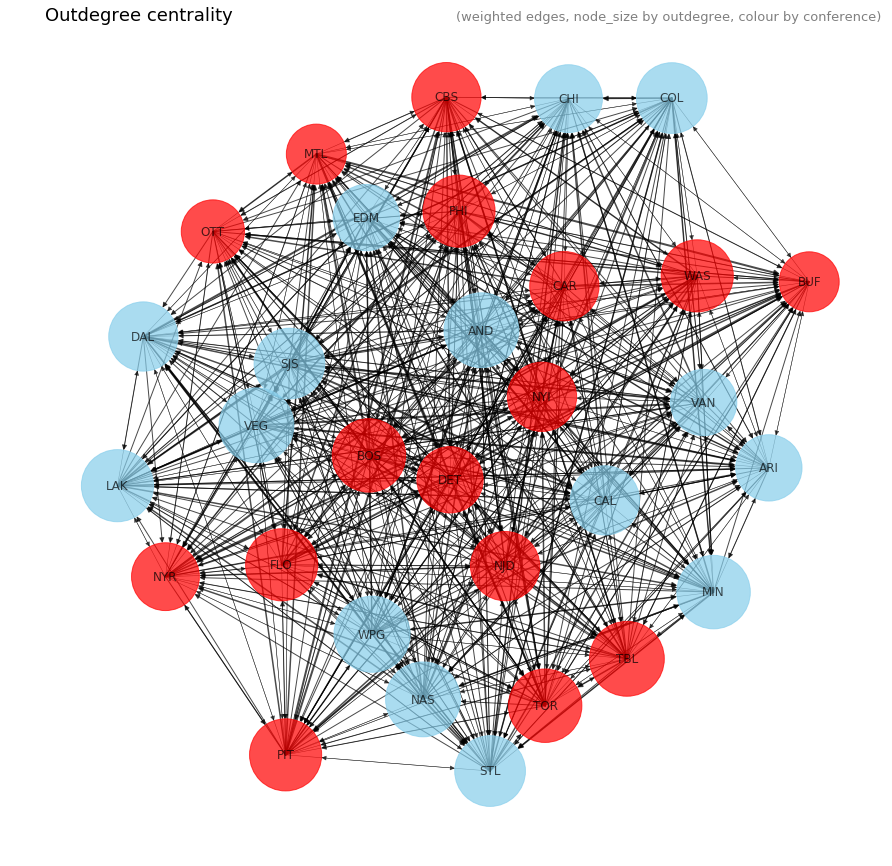

In [100]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(team1)
  
node_size = [200 * nx.get_node_attributes(team1, 'outdegree')[v] for v in team1] 
edge_width = [0.5 * team1[u][v]['weight'] for u, v in team1.edges()] 
  
nx.draw_networkx(team1,
                 pos,
                 node_size = node_size,  
                 node_color = colors_conference,
                 alpha = 0.7, 
                 labels = team_name,
                 width = edge_width) 

plt.title("Outdegree centrality", loc='left', fontsize=18)
plt.title("(weighted edges, node_size by outdegree, colour by conference)", loc='right', fontsize=13, color='grey')

plt.axis("off")
plt.show()

Finally we can calculate some relevant numbers.

In [77]:
team1_betweenness = nx.betweenness_centrality(team1)
team1_closeness = nx.closeness_centrality(team1)
team1_eigenvector = nx.eigenvector_centrality(team1)

In [78]:
team1_betweenness

{1: 0.008698253163714706,
 2: 0.006185927320020877,
 3: 0.0055206435899537495,
 4: 0.00516977772818003,
 5: 0.0072954072714459545,
 6: 0.005899664043481841,
 7: 0.005803981815945647,
 8: 0.006936216928591871,
 9: 0.007102510555331747,
 10: 0.005365365163234419,
 11: 0.0063730316722794954,
 12: 0.0062231070029249115,
 13: 0.007105894878685341,
 14: 0.005017683489702512,
 15: 0.005601480680122862,
 16: 0.003956429522625139,
 18: 0.006790788311843959,
 19: 0.007702697921041921,
 20: 0.005128269797594579,
 21: 0.00542486538925123,
 22: 0.007044223288037139,
 23: 0.005471138949839615,
 24: 0.005827866632995415,
 25: 0.0039658856190981,
 26: 0.007338390390300196,
 28: 0.006873072134227159,
 29: 0.00805240885767109,
 30: 0.006836138859623249,
 31: 0.006261326026367268,
 17: 0.007049933853106185,
 27: 0.006230492705980197}

In [81]:
team1_closeness

{1: 0.8823529411764706,
 2: 0.9375,
 3: 0.75,
 4: 0.967741935483871,
 5: 0.9090909090909091,
 6: 0.8823529411764706,
 7: 0.8333333333333334,
 8: 0.8823529411764706,
 9: 0.8333333333333334,
 10: 0.8108108108108109,
 11: 0.967741935483871,
 12: 0.9090909090909091,
 13: 0.8823529411764706,
 14: 0.75,
 15: 0.7894736842105263,
 16: 0.9090909090909091,
 18: 0.8571428571428571,
 19: 0.9090909090909091,
 20: 0.8333333333333334,
 21: 0.9375,
 22: 0.8823529411764706,
 23: 0.7894736842105263,
 24: 0.8571428571428571,
 25: 0.75,
 26: 0.7692307692307693,
 28: 0.9090909090909091,
 29: 0.8571428571428571,
 30: 0.8108108108108109,
 31: 0.7894736842105263,
 17: 0.7692307692307693,
 27: 0.7692307692307693}

In [82]:
team1_eigenvector

{1: 0.19124898898784617,
 2: 0.20260973546731625,
 3: 0.14273079009765474,
 4: 0.21062696998981656,
 5: 0.19682255940789092,
 6: 0.18814659877705112,
 7: 0.174165231163501,
 8: 0.18980644353442985,
 9: 0.17791863822857684,
 10: 0.16393169623132273,
 11: 0.21035187669553704,
 12: 0.19563857047521288,
 13: 0.18856003505899954,
 14: 0.14411316948258207,
 15: 0.1579252046014888,
 16: 0.19393052170069777,
 18: 0.18419112453855946,
 19: 0.19731054671809944,
 20: 0.1713225835125301,
 21: 0.2048566187419963,
 22: 0.19125940918838708,
 23: 0.1584716466952194,
 24: 0.17992036722418997,
 25: 0.14382569055156202,
 26: 0.15592359420978427,
 28: 0.1977297098744915,
 29: 0.1818222486721812,
 30: 0.17143078416400023,
 31: 0.15726693596536814,
 17: 0.15585365179054397,
 27: 0.15299919457896008}

Text(0,0.5,'Frequency')

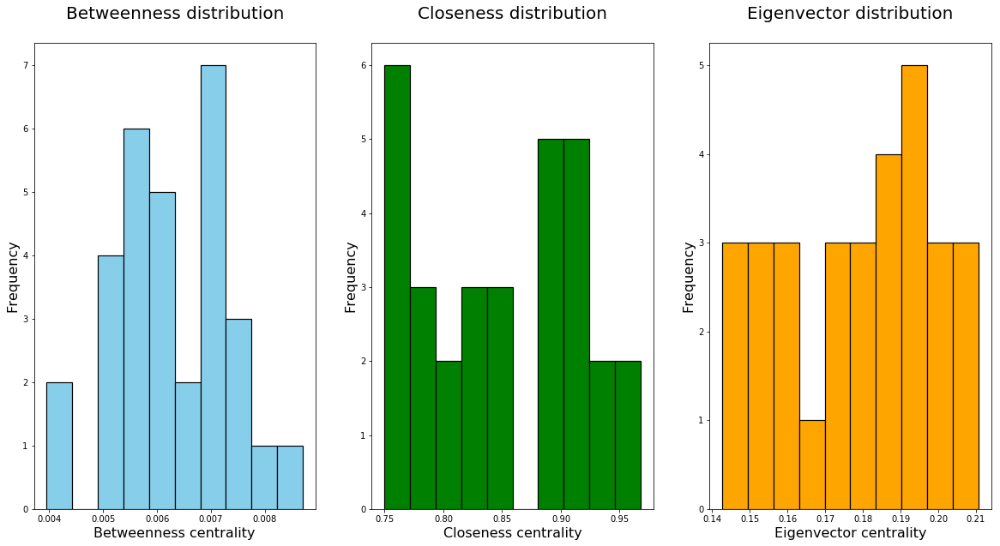

In [98]:
plt.figure(figsize=(20,10))

plt.subplot(1, 3, 1)
plt.hist(team1_betweenness.values(),
         color = 'skyblue', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Betweenness distribution\n", fontsize=20)
plt.xlabel("Betweenness centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 3, 2)
plt.hist(team1_closeness.values(),
         color = 'green', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Closeness distribution\n", fontsize=20)
plt.xlabel("Closeness centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 3, 3)
plt.hist(team1_eigenvector.values(),
         color = 'orange', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Eigenvector distribution\n", fontsize=20)
plt.xlabel("Eigenvector centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

In [99]:
nx.attribute_assortativity_coefficient(team1, 'conference')

0.040445913781250814

In [85]:
dens = nx.density(team1)
dens

0.8182795698924731

In [86]:
recip = nx.reciprocity(team1)
recip

0.7779237844940867

In [93]:
nx.reciprocity(team1, nodes=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31])

{1: 0.8888888888888888,
 2: 0.8,
 3: 0.723404255319149,
 4: 0.723404255319149,
 5: 0.8235294117647058,
 6: 0.8,
 7: 0.75,
 8: 0.7755102040816326,
 9: 0.7755102040816326,
 10: 0.723404255319149,
 11: 0.8235294117647058,
 12: 0.7755102040816326,
 13: 0.8461538461538461,
 14: 0.6956521739130435,
 15: 0.7755102040816326,
 16: 0.6666666666666666,
 17: 0.7755102040816326,
 18: 0.7755102040816326,
 19: 0.8235294117647058,
 20: 0.723404255319149,
 21: 0.75,
 22: 0.8461538461538461,
 23: 0.75,
 24: 0.8,
 25: 0.6666666666666666,
 26: 0.7755102040816326,
 27: 0.75,
 28: 0.7755102040816326,
 29: 0.8679245283018868,
 30: 0.7755102040816326,
 31: 0.8235294117647058}

### Team vs. Team only stronger team

It is really hard to get some information from the network with all the teams and their weighted number of wins. So we decided to create a new adjacency list "strongerteam", that contains only two columns. Columns were reduced because there are now only relationships contained, if one team has more wins against the other team in this regular season.

So the number of edges could be reduced from 761 to 309.

In [101]:
strongerteam = nx.read_edgelist('StrongerTeam.txt',
                        delimiter = '\t', 
                        create_using = nx.DiGraph(), 
                        nodetype = int)

In [102]:
print(nx.info(strongerteam))

Name: 
Type: DiGraph
Number of nodes: 31
Number of edges: 309
Average in degree:   9.9677
Average out degree:   9.9677


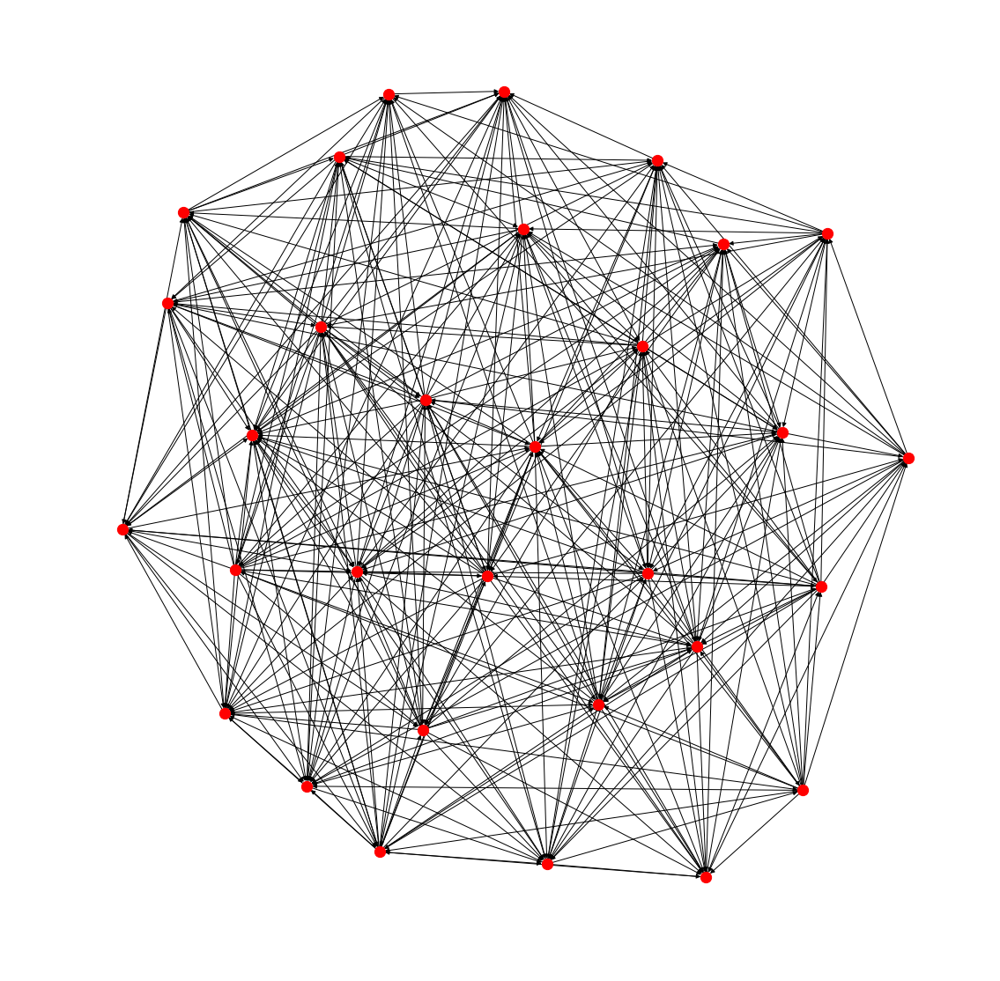

In [103]:
plt.figure(figsize=(15,15))

coords = nx.kamada_kawai_layout(strongerteam)

nx.draw(strongerteam, 
        pos = coords,
        node_size = 150,
        data = True)

In [113]:
strongerteam_indegree = nx.in_degree_centrality(strongerteam)
for i in strongerteam_indegree:
    strongerteam_indegree[i] = int(strongerteam_indegree[i] * (n_nodes_teams-1))

In [114]:
strongerteam_outdegree = nx.out_degree_centrality(strongerteam)
for i in strongerteam_outdegree:
    strongerteam_outdegree[i] = int(strongerteam_outdegree[i] * (n_nodes_teams-1))

In [115]:
nx.set_node_attributes(strongerteam, dict_teams, 'team_name')
nx.set_node_attributes(strongerteam, dict_conf, 'conference')
nx.set_node_attributes(strongerteam, strongerteam_outdegree, 'outdegree')
nx.set_node_attributes(strongerteam, strongerteam_indegree, 'indegree')

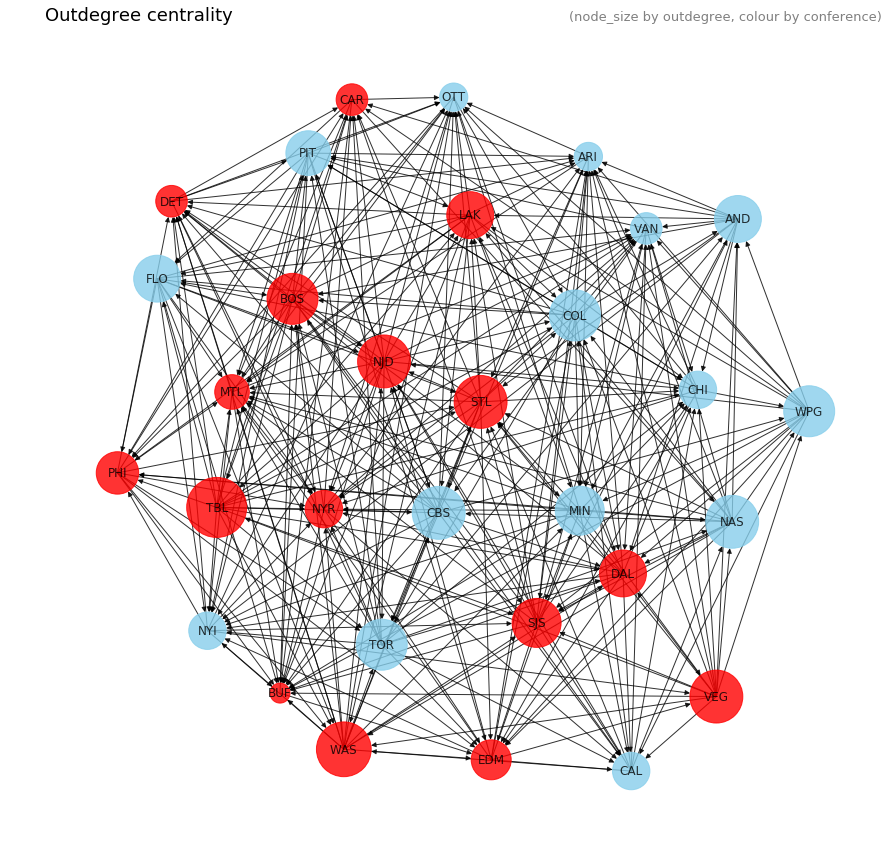

In [134]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(strongerteam)
  
node_size = [200 * nx.get_node_attributes(strongerteam, 'outdegree')[v] for v in strongerteam]
  
nx.draw_networkx(strongerteam,
                 pos,
                 node_size = node_size,  
                 node_color = colors_conference,
                 alpha = 0.8, 
                 labels = team_name) 

plt.title("Outdegree centrality", loc='left', fontsize=18)
plt.title("(node_size by outdegree, colour by conference)", loc='right', fontsize=13, color='grey')

plt.axis("off")
plt.show()

Text(0,0.5,'Frequency')

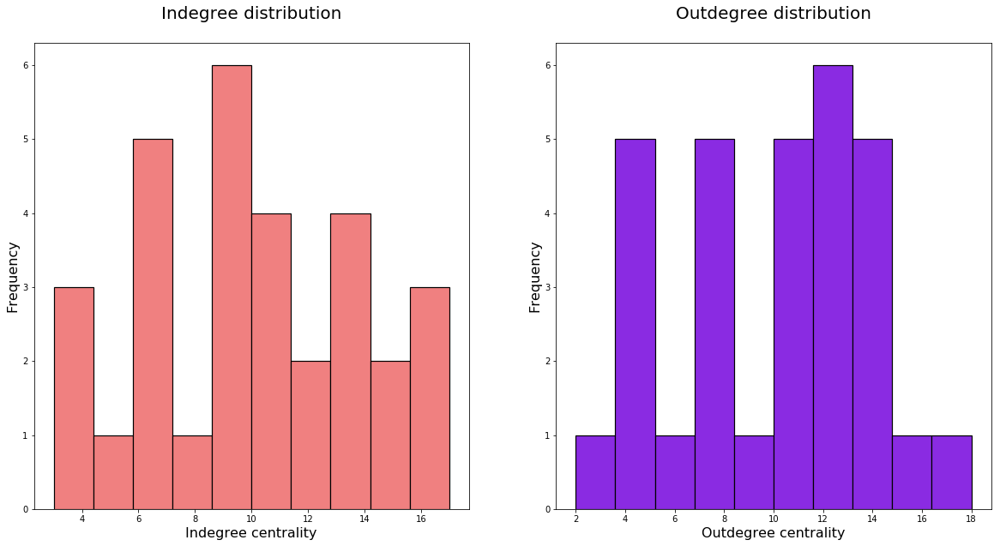

In [129]:
plt.figure(figsize=(20,10))

plt.subplot(1, 2, 1)
plt.hist(strongerteam_indegree.values(),
         color = 'lightcoral', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Indegree distribution\n", fontsize=20)
plt.xlabel("Indegree centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 2, 2)
plt.hist(strongerteam_outdegree.values(),
         color = 'blueviolet', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Outdegree distribution\n", fontsize=20)
plt.xlabel("Outdegree centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

It would be interesting to also add the information whether a team was a playoff-team at the end of regular season or not. Of course this should look similar to the plots before by showing the teams with wins. But we will see...

In [130]:
with open('Playoff.txt') as file:
    playoff = list(map(int, list(file)))

In [131]:
dict_playoff = {i+1: playoff[i] for i in range(0, n_nodes_teams)}
dict_playoff

{1: 1,
 2: 0,
 3: 1,
 4: 0,
 5: 0,
 6: 0,
 7: 1,
 8: 0,
 9: 1,
 10: 0,
 11: 0,
 12: 0,
 13: 0,
 14: 1,
 15: 1,
 16: 0,
 17: 1,
 18: 1,
 19: 0,
 20: 0,
 21: 0,
 22: 1,
 23: 1,
 24: 1,
 25: 0,
 26: 1,
 27: 1,
 28: 0,
 29: 1,
 30: 1,
 31: 1}

In [132]:
nx.set_node_attributes(strongerteam, dict_playoff, 'playoff')
team_playoff = nx.get_node_attributes(strongerteam, 'playoff')

In [133]:
colors_playoff = []
for i in strongerteam.nodes():
    if strongerteam.nodes()[i]['playoff'] == 1:
        colors_playoff.append('green') # in Playoffs
    elif strongerteam.nodes()[i]['playoff'] == 0:
        colors_playoff.append('grey') # not in Playoffs

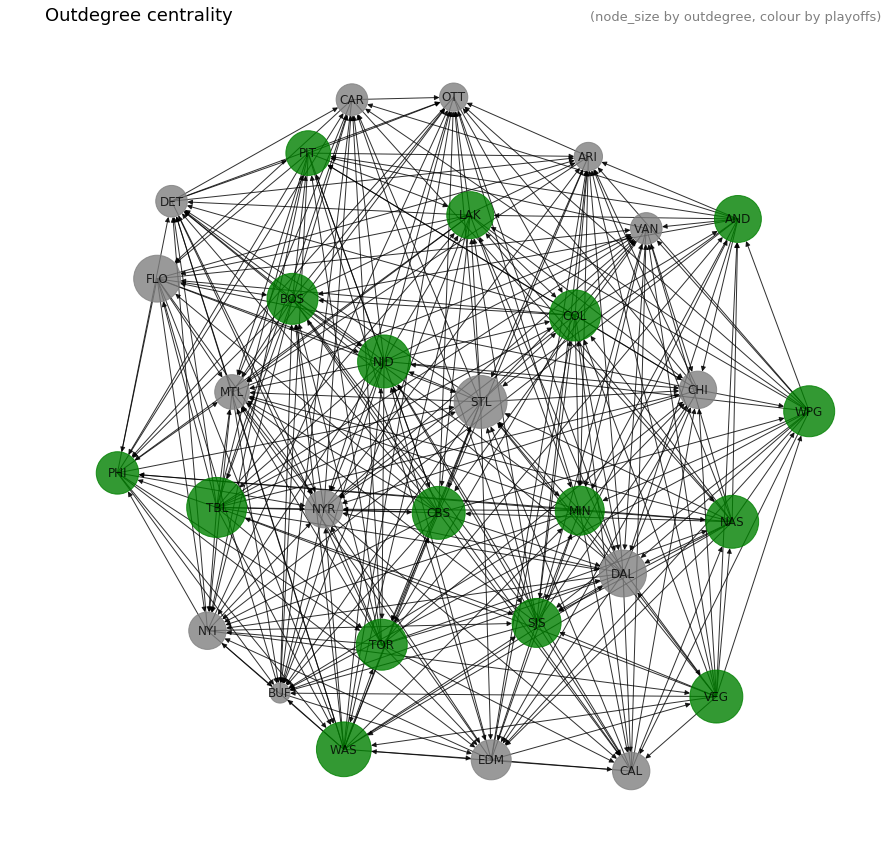

In [149]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(strongerteam)
  
node_size = [200 * nx.get_node_attributes(strongerteam, 'outdegree')[v] for v in strongerteam]
  
nx.draw_networkx(strongerteam,
                 pos,
                 node_size = node_size,  
                 node_color = colors_playoff,
                 alpha = 0.8, 
                 labels = team_name) 

plt.title("Outdegree centrality", loc='left', fontsize=18)
plt.title("(node_size by outdegree, colour by playoffs)", loc='right', fontsize=13, color='grey')

plt.axis("off")
plt.show()

And so we can add information, whether a team reached top3 in their division for direct qualification for playoffs...

In [136]:
with open('Top3.txt') as file:
    top3 = list(map(int, list(file)))

In [137]:
dict_top3 = {i+1: top3[i] for i in range(0, n_nodes_teams)}
dict_top3

{1: 1,
 2: 0,
 3: 1,
 4: 0,
 5: 0,
 6: 0,
 7: 0,
 8: 0,
 9: 0,
 10: 0,
 11: 0,
 12: 0,
 13: 0,
 14: 0,
 15: 1,
 16: 0,
 17: 1,
 18: 0,
 19: 0,
 20: 0,
 21: 0,
 22: 1,
 23: 1,
 24: 1,
 25: 0,
 26: 1,
 27: 1,
 28: 0,
 29: 1,
 30: 1,
 31: 1}

In [138]:
nx.set_node_attributes(strongerteam, dict_top3, 'top3')
team_top3 = nx.get_node_attributes(strongerteam, 'top3')

In [140]:
colors_top3 = []
for i in strongerteam.nodes():
    if strongerteam.nodes()[i]['top3'] == 1:
        colors_top3.append('green') # in Top3 of group
    elif strongerteam.nodes()[i]['top3'] == 0:
        colors_top3.append('grey') # not in Top3 of group

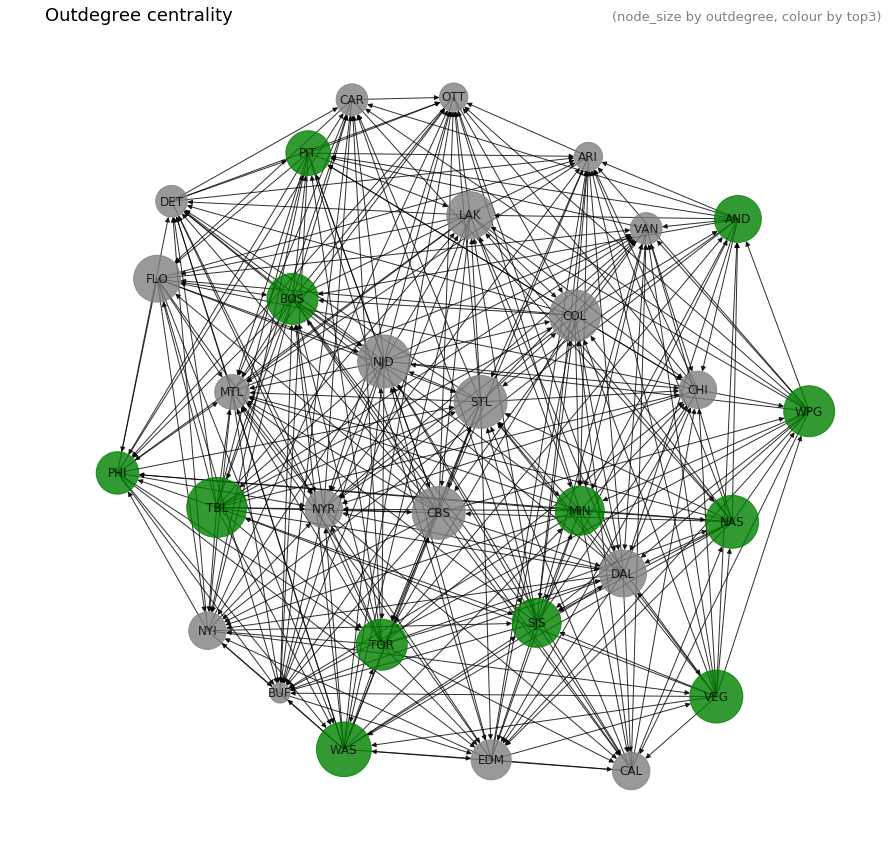

In [150]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(strongerteam)
  
node_size = [200 * nx.get_node_attributes(strongerteam, 'outdegree')[v] for v in strongerteam]
  
nx.draw_networkx(strongerteam,
                 pos,
                 node_size = node_size,  
                 node_color = colors_top3,
                 alpha = 0.8, 
                 labels = team_name) 

plt.title("Outdegree centrality", loc='left', fontsize=18)
plt.title("(node_size by outdegree, colour by top3)", loc='right', fontsize=13, color='grey')

plt.axis("off")
plt.show()

Finally we can calculate some relevant numbers.

In [151]:
strongerteam_betweenness = nx.betweenness_centrality(strongerteam)
strongerteam_closeness = nx.closeness_centrality(strongerteam)
strongerteam_eigenvector = nx.eigenvector_centrality(strongerteam)

In [152]:
strongerteam_betweenness

{1: 0.008906420846076018,
 2: 0.01413785006752339,
 3: 0.051858435137846895,
 6: 0.019858470073987312,
 8: 0.029496498355524717,
 10: 0.024814087497657476,
 14: 0.023075162098141713,
 15: 0.04001608051944339,
 19: 0.026504943651495375,
 23: 0.027989026362571785,
 25: 0.04545119839098699,
 28: 0.024406945477725876,
 16: 0.015134965340500729,
 21: 0.025614319550932123,
 5: 0.024975044764731964,
 11: 0.011592546323783644,
 18: 0.03701872124451392,
 22: 0.024702406450885152,
 24: 0.024867368564123127,
 26: 0.012699457731218165,
 4: 0.01126357997047652,
 12: 0.044719959290953216,
 9: 0.04185493443841902,
 17: 0.029912200170287073,
 30: 0.021860157822952742,
 13: 0.02342875132530305,
 7: 0.029635658796916403,
 20: 0.03462670148572785,
 27: 0.018937842639668197,
 31: 0.012086964740615855,
 29: 0.026599277880504524}

In [153]:
strongerteam_closeness

{1: 0.4838709677419355,
 2: 0.6666666666666666,
 3: 0.5660377358490566,
 6: 0.6,
 8: 0.6,
 10: 0.6,
 14: 0.5555555555555556,
 15: 0.5660377358490566,
 19: 0.6382978723404256,
 23: 0.5660377358490566,
 25: 0.6,
 28: 0.625,
 16: 0.6976744186046512,
 21: 0.6666666666666666,
 5: 0.5882352941176471,
 11: 0.625,
 18: 0.5555555555555556,
 22: 0.5882352941176471,
 24: 0.5882352941176471,
 26: 0.43478260869565216,
 4: 0.6976744186046512,
 12: 0.625,
 9: 0.5769230769230769,
 17: 0.4918032786885246,
 30: 0.5172413793103449,
 13: 0.5263157894736842,
 7: 0.5263157894736842,
 20: 0.6666666666666666,
 27: 0.5084745762711864,
 31: 0.46153846153846156,
 29: 0.4918032786885246}

In [154]:
strongerteam_eigenvector

{1: 0.07061950820083178,
 2: 0.2580816532976422,
 3: 0.14701897132136657,
 6: 0.1833777677788226,
 8: 0.20135031713065973,
 10: 0.15028992217836445,
 14: 0.11875377224022493,
 15: 0.15700168231410852,
 19: 0.2096553429301013,
 23: 0.15295996916020077,
 25: 0.1762065759500653,
 28: 0.21246111975600257,
 16: 0.2812187545948204,
 21: 0.2944118556879316,
 5: 0.1711627555754027,
 11: 0.22108984929777134,
 18: 0.14327705622308692,
 22: 0.1552718800165058,
 24: 0.1363106370058063,
 26: 0.042494764043050824,
 4: 0.3066095562594215,
 12: 0.22538114402829573,
 9: 0.15600657311573163,
 17: 0.08063992824449415,
 30: 0.08863512755436184,
 13: 0.11301905900458188,
 7: 0.10290703225803641,
 20: 0.3061735444494496,
 27: 0.10203897017138978,
 31: 0.05365738207092954,
 29: 0.06985537714839515}

Text(0,0.5,'Frequency')

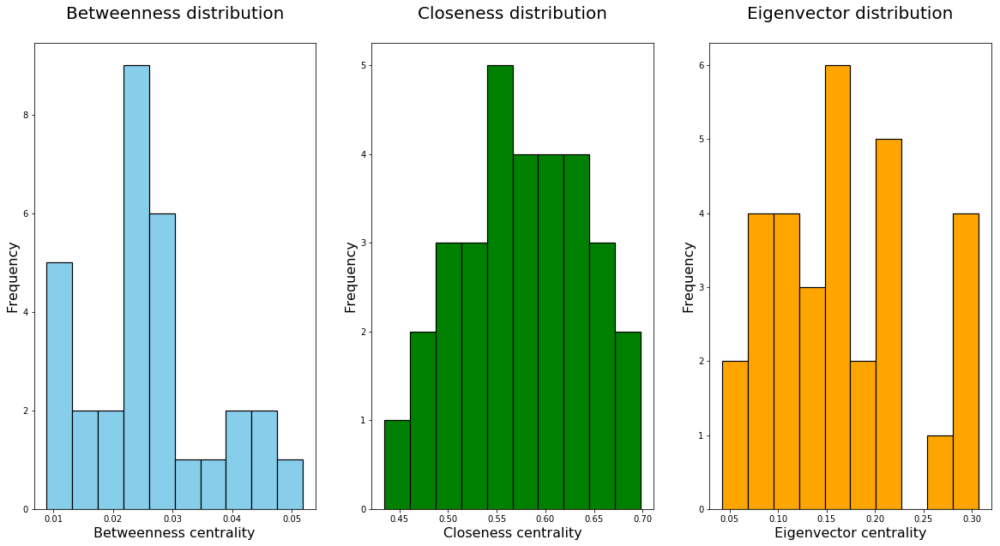

In [155]:
plt.figure(figsize=(20,10))

plt.subplot(1, 3, 1)
plt.hist(strongerteam_betweenness.values(),
         color = 'skyblue', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Betweenness distribution\n", fontsize=20)
plt.xlabel("Betweenness centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 3, 2)
plt.hist(strongerteam_closeness.values(),
         color = 'green', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Closeness distribution\n", fontsize=20)
plt.xlabel("Closeness centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 3, 3)
plt.hist(strongerteam_eigenvector.values(),
         color = 'orange', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Eigenvector distribution\n", fontsize=20)
plt.xlabel("Eigenvector centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

In [157]:
nx.attribute_assortativity_coefficient(strongerteam, 'conference')

0.25629434293966213

In [158]:
nx.attribute_assortativity_coefficient(strongerteam, 'playoff')

0.047619047619047665

In [159]:
nx.attribute_assortativity_coefficient(strongerteam, 'top3')

0.0405739940418748

In [160]:
dens = nx.density(strongerteam)
dens

0.33225806451612905

In [161]:
recip = nx.reciprocity(strongerteam)
recip

0.0

### Players of WAS (Washington Capitals)

Now we want to have a closer look into the social network of the best team of this season: Washington Capitals.

For this purpose, we've created an adjacency list with three columns. In the third column is the number of how often the scorer and the assister were in the same constellation.

Scorer (PlayerID) | Assister (PlayerID) | Number
--- | --- | ---
1 | 3 | 1
1 | 4 | 2
... | ... | ...

These data has been read into nx.DiGraph "player1".

In [163]:
player1 = nx.read_edgelist('PlayerGoals.txt',
                        delimiter = '\t', 
                        create_using = nx.DiGraph(), 
                        nodetype = int,
                        data = (('weight',int),))

In [164]:
print(nx.info(player1))

Name: 
Type: DiGraph
Number of nodes: 21
Number of edges: 130
Average in degree:   6.1905
Average out degree:   6.1905


In [165]:
player1.edges(data=True)

OutEdgeDataView([(1, 3, {'weight': 1}), (1, 4, {'weight': 2}), (1, 7, {'weight': 2}), (1, 8, {'weight': 1}), (1, 12, {'weight': 4}), (1, 15, {'weight': 3}), (1, 16, {'weight': 5}), (3, 1, {'weight': 1}), (3, 4, {'weight': 1}), (3, 7, {'weight': 2}), (3, 9, {'weight': 2}), (3, 10, {'weight': 1}), (3, 11, {'weight': 1}), (3, 12, {'weight': 1}), (3, 14, {'weight': 1}), (3, 16, {'weight': 1}), (4, 1, {'weight': 2}), (4, 9, {'weight': 1}), (4, 12, {'weight': 3}), (4, 15, {'weight': 2}), (4, 16, {'weight': 4}), (4, 18, {'weight': 1}), (4, 21, {'weight': 1}), (7, 2, {'weight': 1}), (7, 13, {'weight': 1}), (7, 3, {'weight': 2}), (7, 9, {'weight': 4}), (7, 12, {'weight': 1}), (7, 15, {'weight': 1}), (7, 16, {'weight': 3}), (7, 21, {'weight': 1}), (8, 1, {'weight': 1}), (8, 9, {'weight': 1}), (8, 17, {'weight': 1}), (12, 1, {'weight': 3}), (12, 4, {'weight': 2}), (12, 5, {'weight': 1}), (12, 7, {'weight': 1}), (12, 8, {'weight': 1}), (12, 9, {'weight': 1}), (12, 13, {'weight': 2}), (12, 14, {'we

For better comprehensability we added also a list with the player names, so we can use them as labels.

In [167]:
with open('Players.txt') as file:
    players = list(map(lambda s: s.strip(), list(file)))

In [168]:
n_nodes_players = len(players)

In [169]:
dict_players = {i+1: players[i] for i in range(0, n_nodes_players)}
dict_players

{1: 'Backstrom',
 2: 'Beagle',
 3: 'Burakovsky',
 4: 'Carlson',
 5: 'Chiasson',
 6: 'Chorney',
 7: 'Connolly',
 8: 'Djoos',
 9: 'Eller',
 10: 'Jerabek',
 11: 'Kempny',
 12: 'Kuznetsov',
 13: 'Niskanen',
 14: 'Orlov',
 15: 'Oshie',
 16: 'Ovechkin',
 17: 'Smith',
 18: 'Stephenson',
 19: 'Vrana',
 20: 'Walker',
 21: 'Wilson'}

In [170]:
nx.set_node_attributes(player1, dict_players, 'player_name')
player_name = nx.get_node_attributes(player1, 'player_name')

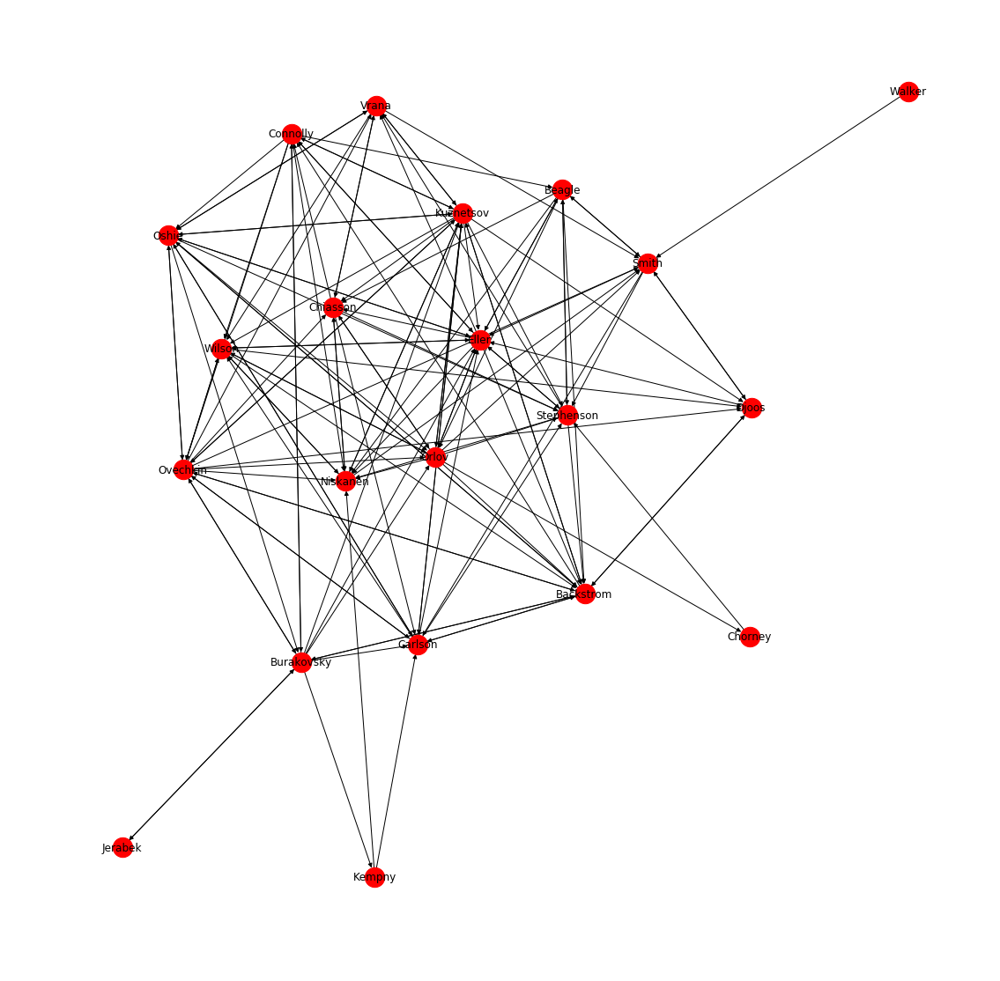

In [171]:
plt.figure(figsize=(15,15))

coords = nx.kamada_kawai_layout(player1)

nx.draw(player1, 
        pos = coords,
        node_size = 500,
        data = True,
        labels = player_name)

We add the position in form of a list, so we can mark them with different colors:
- D = Defense
- O = Offense
- C = Center

In [172]:
with open('Position.txt') as file:
    position = list(map(lambda s: s.strip(), list(file)))

In [173]:
dict_pos = {i+1: position[i] for i in range(0, n_nodes_players)}
dict_pos

{1: 'C',
 2: 'O',
 3: 'O',
 4: 'D',
 5: 'O',
 6: 'D',
 7: 'O',
 8: 'D',
 9: 'C',
 10: 'D',
 11: 'D',
 12: 'C',
 13: 'D',
 14: 'D',
 15: 'O',
 16: 'O',
 17: 'O',
 18: 'C',
 19: 'O',
 20: 'O',
 21: 'O'}

In [174]:
nx.set_node_attributes(player1, dict_pos, 'position')
player_position = nx.get_node_attributes(player1, 'position')

In [176]:
colors_position = []

for i in player1.nodes():
    if player1.nodes()[i]['position'] == 'C':
        colors_position.append('red') # Center
    elif player1.nodes()[i]['position'] == 'D':
        colors_position.append('skyblue') # Defense
    elif player1.nodes()[i]['position'] == 'O':
        colors_position.append('green') # Offense

In [177]:
player1_outdegree = nx.out_degree_centrality(player1)
for i in player1_outdegree:
    player1_outdegree[i] = int(player1_outdegree[i] * (n_nodes_players-1))

player1_indegree = nx.in_degree_centrality(player1)
for i in player1_indegree:
    player1_indegree[i] = int(player1_indegree[i] * (n_nodes_players-1))

player1_degree = nx.degree_centrality(player1)
for i in player1_degree:
    player1_degree[i] = int(player1_degree[i] * (n_nodes_players-1))

In [178]:
nx.set_node_attributes(player1, player1_outdegree, 'outdegree')
nx.set_node_attributes(player1, player1_indegree, 'indegree')
nx.set_node_attributes(player1, player1_degree, 'degree')

Text(0,0.5,'Frequency')

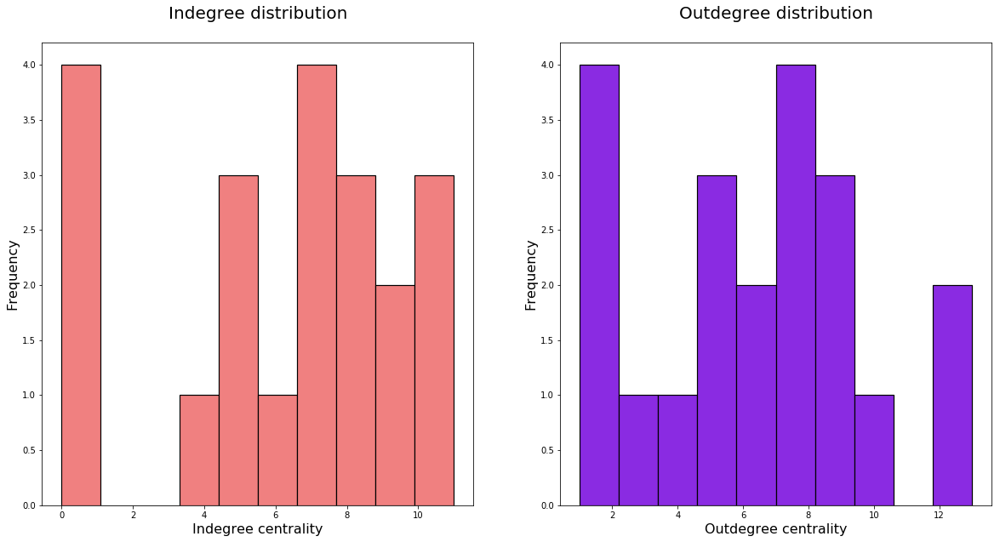

In [189]:
plt.figure(figsize=(20,10))

plt.subplot(1, 2, 1)
plt.hist(player1_indegree.values(),
         color = 'lightcoral', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Indegree distribution\n", fontsize=20)
plt.xlabel("Indegree centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 2, 2)
plt.hist(player1_outdegree.values(),
         color = 'blueviolet', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Outdegree distribution\n", fontsize=20)
plt.xlabel("Outdegree centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

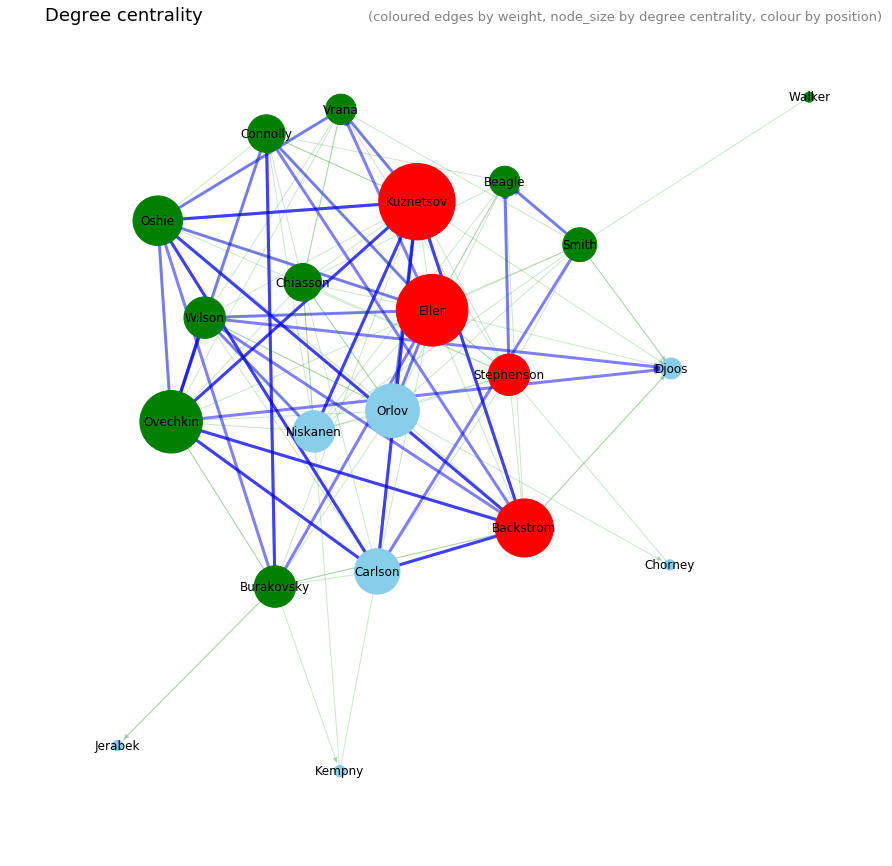

In [179]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(player1)

sizes = [v**2.8+100 for v in player1_degree.values()]
elarge = [(u, v) for (u, v, d) in player1.edges(data=True) if d["weight"] > 1]
esmall = [(u, v) for (u, v, d) in player1.edges(data=True) if d["weight"] <= 1]

# nodes
nx.draw_networkx_nodes(player1,
                       pos,
                       node_size=sizes,
                       node_color = colors_position)

# edges
nx.draw_networkx_edges(player1,
                       pos,
                       edgelist=elarge,
                       width=3,
                       alpha=0.5,
                       edge_color="blue")
nx.draw_networkx_edges(player1,
                       pos,
                       edgelist=esmall,
                       width=1,
                       alpha=0.2,
                       edge_color="green")

# labels
nx.draw_networkx_labels(player1,
                        pos,
                        player_name,
                        font_size=12)

plt.title("Degree centrality", loc='left', fontsize=18)
plt.title("(coloured edges by weight, node_size by degree centrality, colour by position)", loc='right', fontsize=13, color='grey')

plt.axis("off")
plt.show()

In [198]:
nx.get_node_attributes(player1, 'degree')

{1: 18,
 3: 14,
 4: 15,
 7: 13,
 8: 8,
 12: 22,
 15: 16,
 16: 19,
 2: 11,
 5: 13,
 9: 21,
 13: 14,
 14: 17,
 17: 12,
 18: 14,
 10: 2,
 11: 3,
 21: 14,
 19: 11,
 6: 2,
 20: 1}

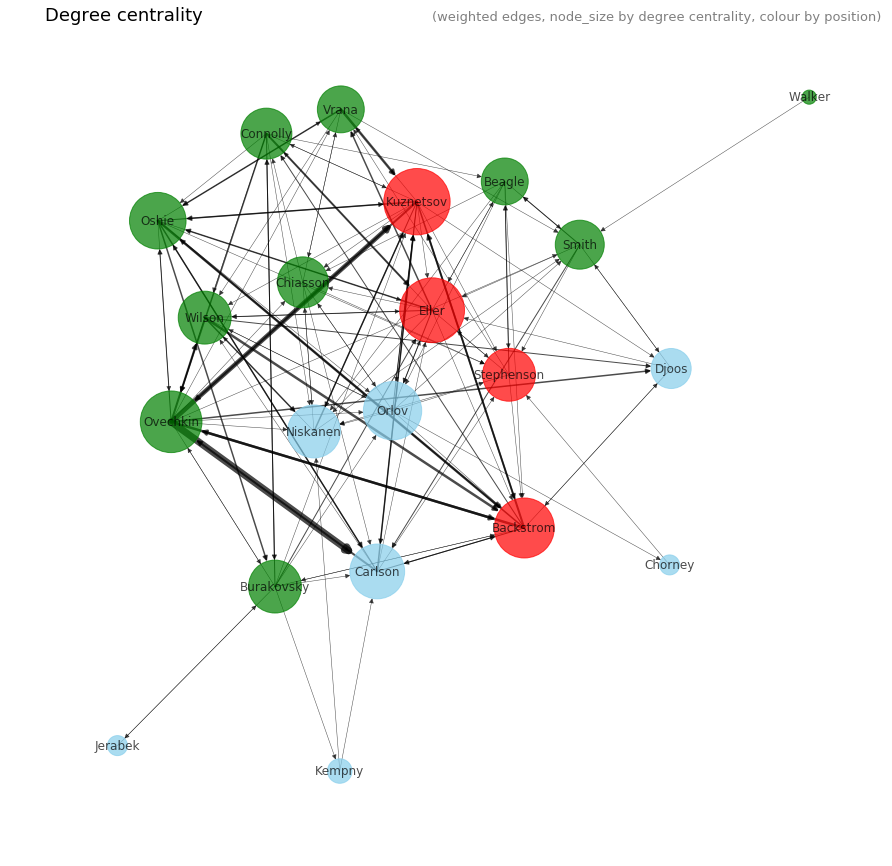

In [180]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(player1)
  
node_size = [200 * nx.get_node_attributes(player1, 'degree')[v] for v in player1] 
edge_width = [0.5 * player1[u][v]['weight'] for u, v in player1.edges()] 
  
nx.draw_networkx(player1,
                 pos,
                 node_size = node_size,  
                 node_color = colors_position,
                 alpha = 0.7, 
                 labels = player_name,
                 width = edge_width) 

plt.title("Degree centrality", loc='left', fontsize=18)
plt.title("(weighted edges, node_size by degree centrality, colour by position)", loc='right', fontsize=13, color='grey')

plt.axis("off")
plt.show()

Interesting is, that it doesn't show the real line combinations:

**Offense**
- Ovechkin - Backtrom - Wilson
- Vrana - Kuznetsov - Oshie

**Defense**
- Kempny - Carlson
- Orlov - Niskanen

**Powerplay**
- Backstrom - Kuznetsov - Oshie - Ovechkin - Carlson

Finally we can calculate some relevant numbers.

In [181]:
player1_betweenness = nx.betweenness_centrality(player1)
player1_closeness = nx.closeness_centrality(player1)
player1_eigenvector = nx.eigenvector_centrality(player1)

In [182]:
player1_betweenness

{1: 0.12135964912280701,
 3: 0.14992167919799498,
 4: 0.0647796574770259,
 7: 0.03401002506265664,
 8: 0.0060745614035087716,
 12: 0.0633782372598162,
 15: 0.038530701754385964,
 16: 0.05271720969089389,
 2: 0.023320802005012527,
 5: 0.020231829573934833,
 9: 0.10128446115288219,
 13: 0.0293796992481203,
 14: 0.07086988304093567,
 17: 0.075046992481203,
 18: 0.06631161236424395,
 10: 0.0,
 11: 0.0008771929824561403,
 21: 0.024756683375104425,
 19: 0.015043859649122804,
 6: 0.0,
 20: 0.0}

In [183]:
player1_closeness

{1: 0.6666666666666666,
 3: 0.4878048780487805,
 4: 0.6060606060606061,
 7: 0.5263157894736842,
 8: 0.5128205128205128,
 12: 0.6060606060606061,
 15: 0.5555555555555556,
 16: 0.5714285714285714,
 2: 0.5263157894736842,
 5: 0.5555555555555556,
 9: 0.6896551724137931,
 13: 0.625,
 14: 0.5714285714285714,
 17: 0.5714285714285714,
 18: 0.625,
 10: 0.3333333333333333,
 11: 0.3448275862068966,
 21: 0.5714285714285714,
 19: 0.5405405405405406,
 6: 0.38461538461538464,
 20: 0.0}

In [184]:
player1_eigenvector

{1: 0.34557553752106607,
 3: 0.13876154300947352,
 4: 0.22841111428450545,
 7: 0.1804483788228567,
 8: 0.178832565700124,
 12: 0.28987515702045014,
 15: 0.2457335545363972,
 16: 0.23117517633156212,
 2: 0.12709061722810278,
 5: 0.23519593556522012,
 9: 0.31932473274473017,
 13: 0.2970603908644429,
 14: 0.2526809520717742,
 17: 0.17674982504659775,
 18: 0.2593034358828893,
 10: 0.018844200242089656,
 11: 0.018844200242089656,
 21: 0.2734609010476142,
 19: 0.21465443485413344,
 6: 0.03431535850546743,
 20: 1.388285248573181e-10}

Text(0,0.5,'Frequency')

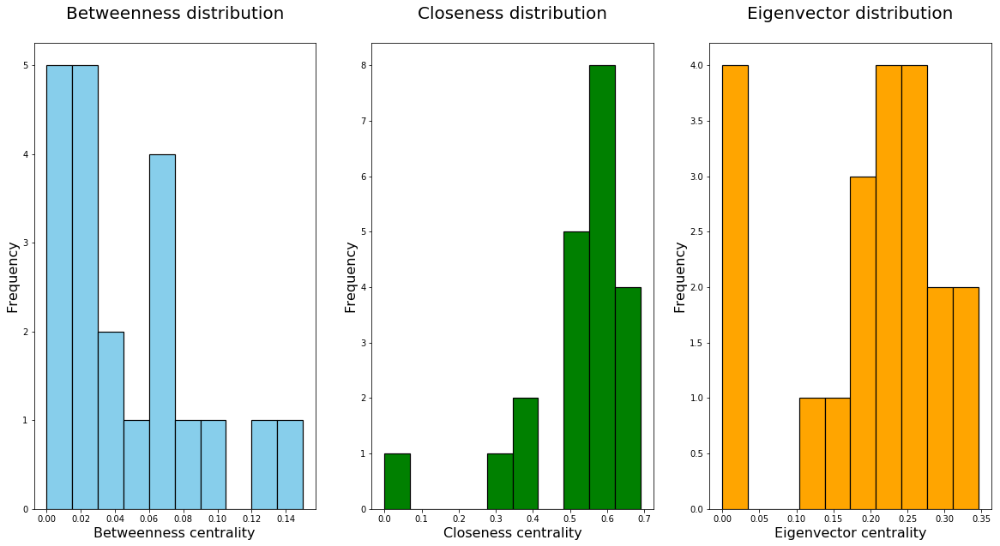

In [185]:
plt.figure(figsize=(20,10))

plt.subplot(1, 3, 1)
plt.hist(player1_betweenness.values(),
         color = 'skyblue', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Betweenness distribution\n", fontsize=20)
plt.xlabel("Betweenness centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 3, 2)
plt.hist(player1_closeness.values(),
         color = 'green', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Closeness distribution\n", fontsize=20)
plt.xlabel("Closeness centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

plt.subplot(1, 3, 3)
plt.hist(player1_eigenvector.values(),
         color = 'orange', 
         edgecolor = 'black', 
         linewidth = 1.2)
plt.title("Eigenvector distribution\n", fontsize=20)
plt.xlabel("Eigenvector centrality", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

In [186]:
nx.attribute_assortativity_coefficient(player1, 'position')

-0.09801373677371446

In [187]:
dens = nx.density(player1)
dens

0.30952380952380953

In [188]:
recip = nx.reciprocity(player1)
recip

0.5384615384615384

In [190]:
nx.reciprocity(player1, nodes=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21])

{1: 0.6666666666666666,
 2: 0.5454545454545454,
 3: 0.5714285714285714,
 4: 0.5333333333333333,
 5: 0.46153846153846156,
 6: 0.0,
 7: 0.46153846153846156,
 8: 0.5,
 9: 0.5714285714285714,
 10: 1.0,
 11: 0.0,
 12: 0.7272727272727273,
 13: 0.42857142857142855,
 14: 0.47058823529411764,
 15: 0.75,
 16: 0.631578947368421,
 17: 0.3333333333333333,
 18: 0.2857142857142857,
 19: 0.5454545454545454,
 20: 0.0,
 21: 0.5714285714285714}

### Community detection

It could be interesting to have a look into community detection. So this would provide the possibility to make some compares between these communities and for example the position of the players.

Therefore we use a new adjacency matrix without weights (so only two columns).

In [191]:
player2 = nx.read_edgelist('PlayerGoals2.txt',
                        delimiter = '\t',  
                        nodetype = int)

In [192]:
comm = community.best_partition(player2)

In [193]:
community.modularity(comm, player2)

0.10587257617728534

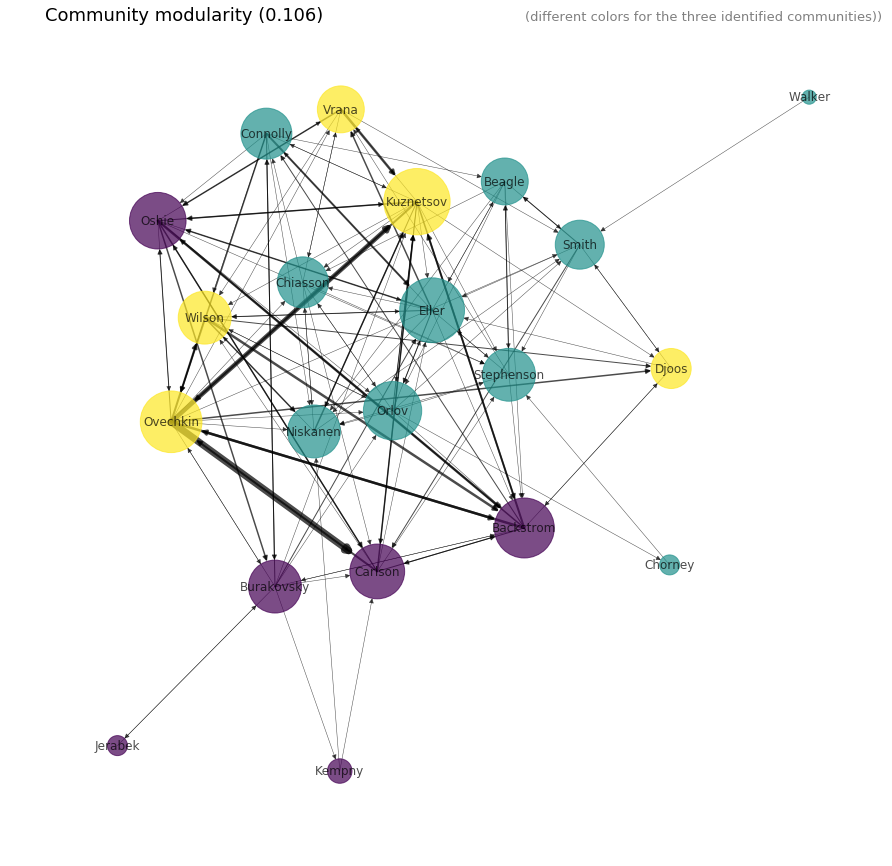

In [243]:
plt.figure(figsize=(15,15))

pos = nx.kamada_kawai_layout(player1)
  
node_size = [200 * nx.get_node_attributes(player1, 'degree')[v] for v in player1] 
edge_width = [0.5 * player1[u][v]['weight'] for u, v in player1.edges()] 
  
nx.draw_networkx(player1,
                 pos,
                 node_size = node_size,  
                 node_color = list(dict.values(comm)),
                 alpha = 0.7, 
                 labels = player_name,
                 width = edge_width) 

plt.title("Community modularity (0.106)", loc='left', fontsize=18)
plt.title("(different colors for the three identified communities))", loc='right', fontsize=13, color='grey')

plt.axis("off")
plt.show()

## Learnings

- Social interactions is really cool stuff and has potential also in sports
- Find and prepare the right data is really hard
- There is a need for webscraping and automate procedures (better code) so compares are possible (between teams or between years)
- Stackoverflow is your bestfriend